# UMAPs Neurips samples, NK cells

In this notebook UMAPs are generated from latent space. Leiden clusters are calculated  and highly expressed genes/markers are searched using scanpy rank_genes_groups -function.

Only one Neurips sample is selected. 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot
from pySankey import sankey

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


# 1. Preparations

In [2]:
#Neurips

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [3]:
adata = adata.copy()

In [4]:
#Both NK cell types selected  + one sample is selected

adata = adata[(adata.obs['cell_type'] == "NK") | (adata.obs['cell_type'] == "NK CD158e1+")]

In [5]:
#Selecting only one sample

adata =adata[adata.obs['POOL'] == "s4d1"]

In [6]:
adata.shape

(665, 21720)

In [7]:
#protein information saved

adata_prot=adata.obsm['protein_expression_clr_neurips']

In [8]:
#Neurips, latent

adata_latent = adata.copy()

In [9]:
adata_latent

AnnData object with n_obs × n_vars = 665 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

# Leiden clusters

In [10]:
#Removing MALAT1 and mito + ribo genes from adata_gex

#MALAT1 is more or less technical finding => remove

#malat1 = adata_gex.var_names.str.startswith('MALAT1')

#genes to be removed
mito_genes = adata_latent.var_names.str.startswith('MT-')
ribo_genes = adata_latent.var_names.str.startswith('RPL')
ribo_genes1 = adata_latent.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_latent = adata_latent[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

In [11]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_latent, use_rep="X_totalVI")    

sc.tl.umap(adata_latent)


In [12]:
#Calculating leidens for latent object
sc.tl.leiden(adata_latent, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata_latent, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(adata_latent, resolution = 0.6, key_added = "leiden_0_6")



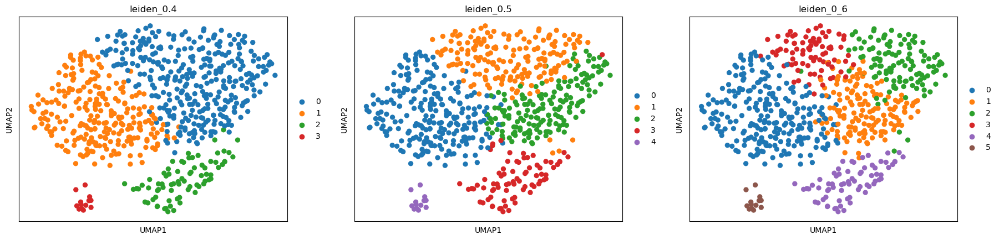

In [13]:
#Showing results in UMAPs

sc.pl.umap(adata_latent, color=['leiden_0.4', 'leiden_0.5', 'leiden_0_6'], ncols =3)


### Subclustering 

Cluster 4 is further clustered to find tissue-resident NK cell population

In [14]:
orig_key = 'leiden_0.4' 
new_key = 'leiden_0.4'
new_rg_key = 'rg_res0.4_sub'
sub_key = '2'

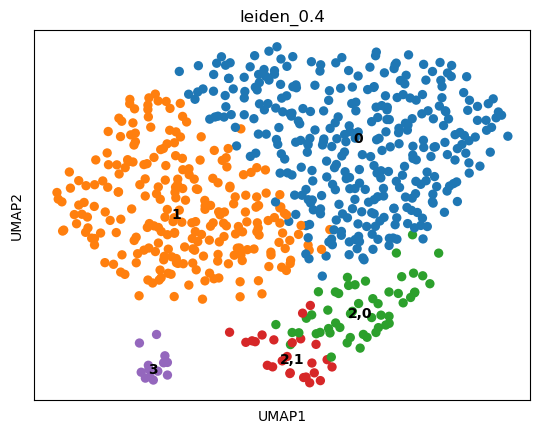

0      331
1      245
2,0     51
2,1     25
3       13
Name: leiden_0.4, dtype: int64

In [15]:
res = 0.3
sc.tl.leiden(adata_latent, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_latent, color=new_key, legend_loc = 'on data')
adata_latent.obs[new_key].value_counts()

In [16]:
adata_latent

AnnData object with n_obs × n_vars = 665 × 21604
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'leiden_0.4', 'leiden_0.5', 'leiden_0_6'
    uns: 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0_6_colors'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_tota

In [17]:
#7 clusters
cols = ['#43CD80', '#7FFFD4', '#BF3EFF', '#FFEC8B', '#FFC1C1', '#FFA500']

adata_latent.uns['leiden_0.4_colors'] = cols

In [18]:
cluster_names = [
    '1', '2',
    '3', '4',
    '5']

adata_latent.rename_categories('leiden_0.4', cluster_names)

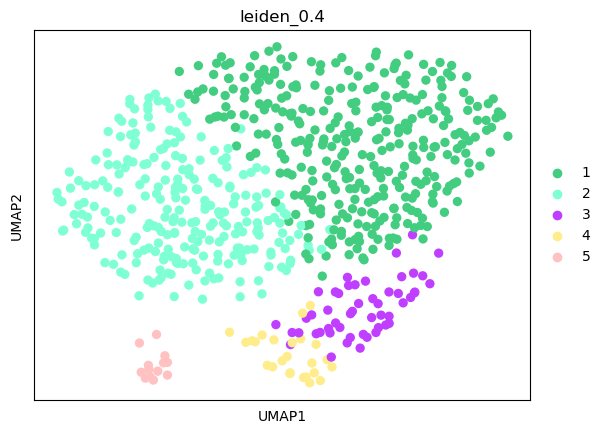

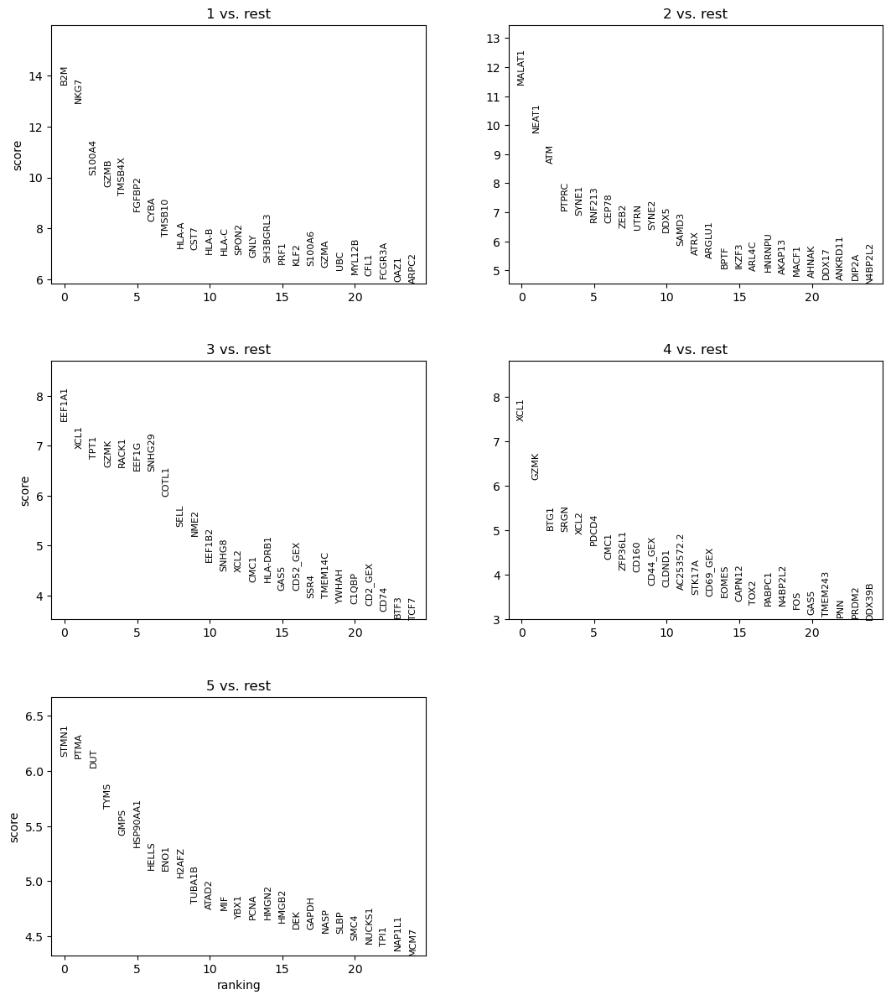

In [19]:
#Latent

sc.pl.umap(adata_latent, color=['leiden_0.4'])
sc.tl.rank_genes_groups(adata_latent, 'leiden_0.4', method='wilcoxon')
sc.pl.rank_genes_groups(adata_latent, n_genes=25, sharey=False, ncols=2)

In [20]:
adata_latent

AnnData object with n_obs × n_vars = 665 × 21604
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'leiden_0.4', 'leiden_0.5', 'leiden_0_6'
    uns: 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0_6_colors', 'rank_genes_groups'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_um

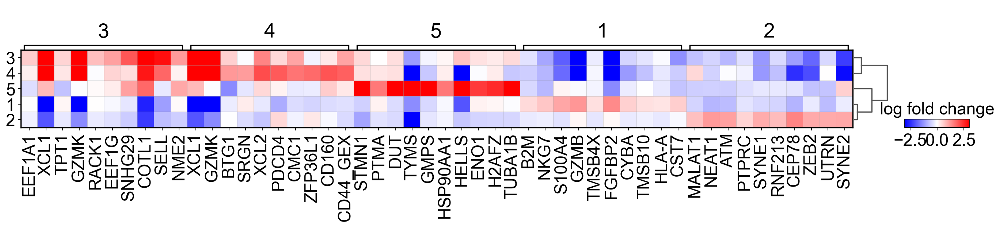

In [35]:
sc.pl.rank_genes_groups_matrixplot(adata_latent, n_genes=10, use_raw=False, values_to_plot="logfoldchanges", colorbar_title='log fold change', vmin=-3, vmax=3, cmap='bwr')

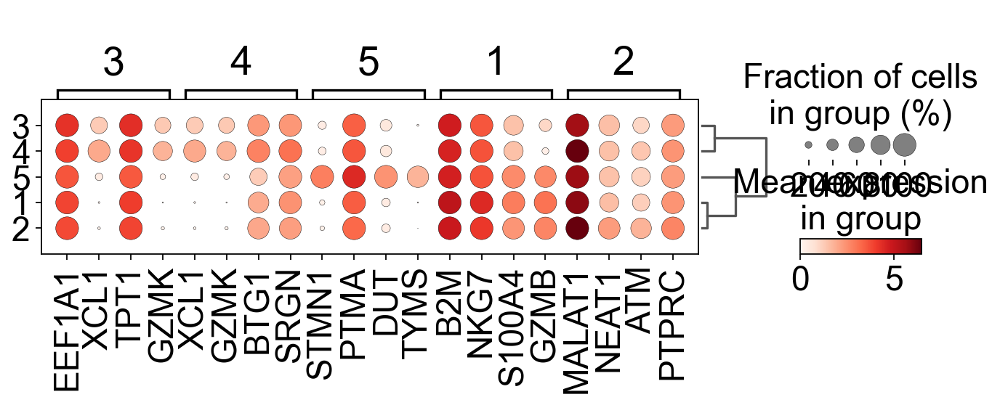

In [36]:
sc.pl.rank_genes_groups_dotplot(adata_latent, n_genes=4)

categories: 1, 2, 3, etc.
var_group_labels: 1, 2, 3, etc.


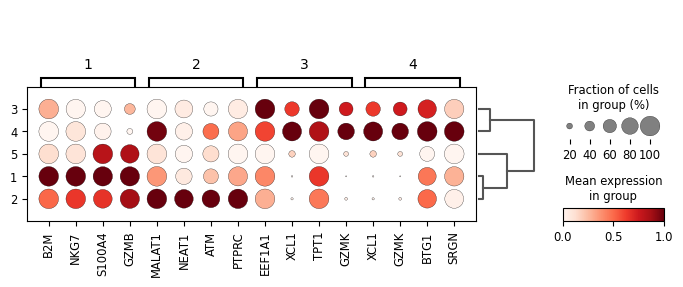

In [23]:
# standard_scale='var' => scaled values

sc.pl.rank_genes_groups_dotplot(adata_latent, n_genes=4, groups=['1','2', '3', '4'], standard_scale='var')

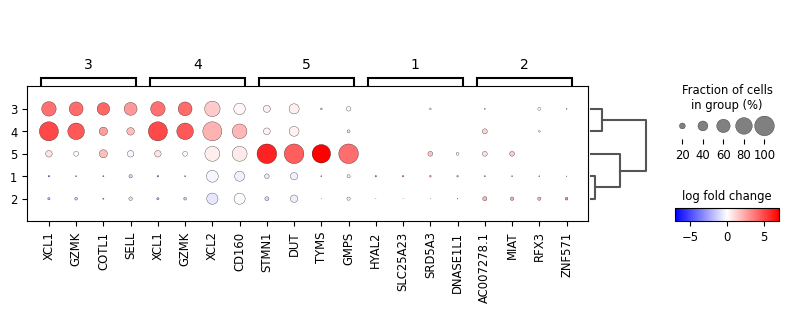

In [24]:
sc.pl.rank_genes_groups_dotplot(adata_latent, n_genes=4, values_to_plot='logfoldchanges', min_logfoldchange=2, vmax=7, vmin=-7, cmap='bwr')


categories: 1, 2, 3, etc.
var_group_labels: 1, 2, 3, etc.


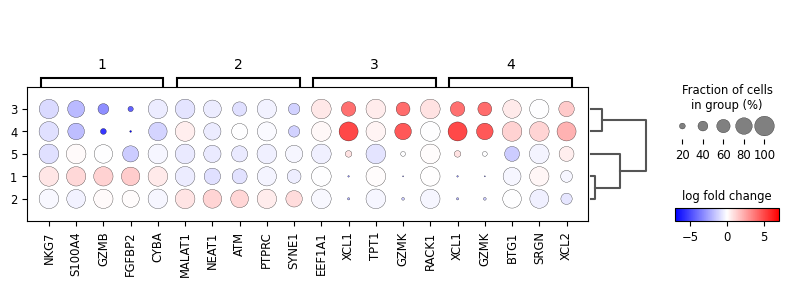

In [25]:
sc.pl.rank_genes_groups_dotplot(adata_latent, n_genes=5, values_to_plot='logfoldchanges', min_logfoldchange=0.5, vmax=7, vmin=-7, cmap='bwr', groups=['1','2', '3', '4'])


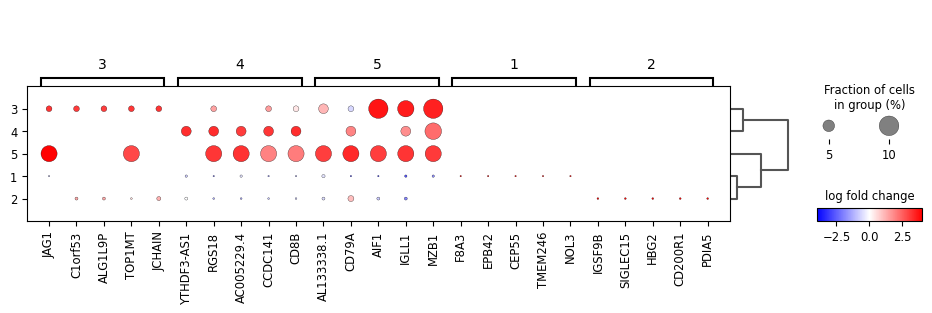

In [26]:
#plotting last 5 genes

sc.pl.rank_genes_groups_dotplot(
    adata_latent,
    n_genes=-5,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-4,
    vmax=4,
    min_logfoldchange=3,
    colorbar_title='log fold change',
)

In [27]:
adata_latent

AnnData object with n_obs × n_vars = 665 × 21604
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'leiden_0.4', 'leiden_0.5', 'leiden_0_6'
    uns: 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0_6_colors', 'rank_genes_groups', 'dendrogram_leiden_0.4'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls

- Cluster 0:??  NEAT1 is a long-noncoding RNA. SYNE1, SYNE2 => innate immune response?
- Cluster 1: B2M, NKG7, GZMB, PRF1 => mature CD56dim (Huuhtanen, Yang).
- Cluster 2: Mature NK (similar to cluster 1) 
- Cluster 3: ZEB2, CX3CR1 => terminal NK (Yang) 
- Cluster 4: GZMK, XCL1, SELL (CD62L) => Immature CD56bright
- Cluster 4,1: tissue-resident NK (CD160, CD69). 
- Cluster 5: proliferating NK. STM1, TYMS, HMGB2, H2FZ (Melsen).

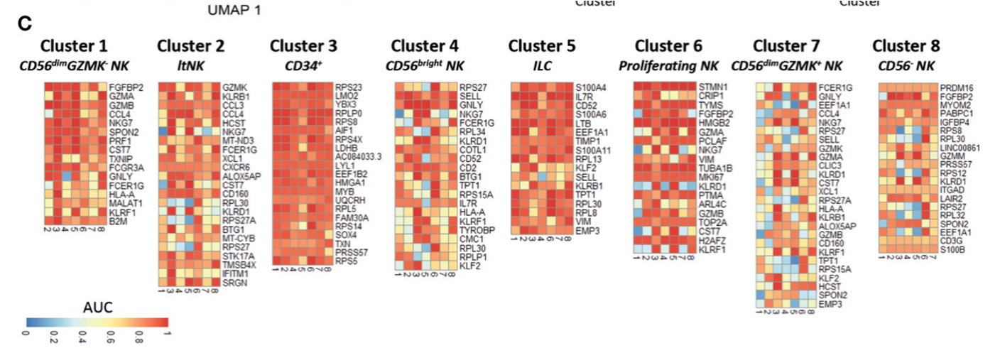
(Melsen et al. 2022)


- Clusters 1, 2, 4, 6, 7 of above figure were found also in other datasets (Crinier + Yang) 

In [28]:
prot_1 = adata_latent.obsm['protein_expression_clr_neurips']

In [29]:
#some proteins and genes have same names, here _prot added after protein names

prot_1=prot_1.rename(columns={'CD2': 'CD2_prot', 'KLRG1': 'KLRG_prot', 'CX3CR1': 'CX3CR1_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD34': 'CD34_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD5': 'CD5_prot'})

In [30]:
#adding protein information to obs

a = adata_latent.obs
b = prot_1

adata1=pd.concat([a, b], axis=1)
adata_latent.obs=adata1

adata_latent

AnnData object with n_obs × n_vars = 665 × 21604
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'leiden_0.4', 'leiden_0.5', 'leiden_0_6', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'C

## Markers for each cluster (protein/RNA)

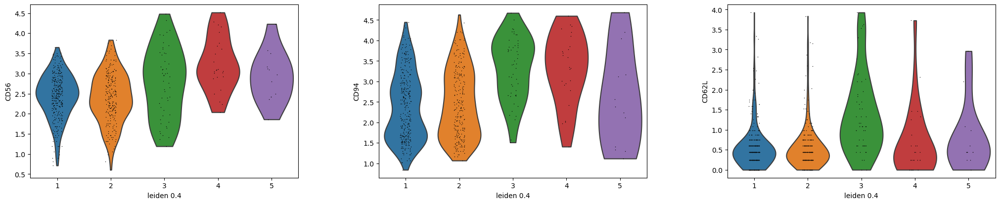

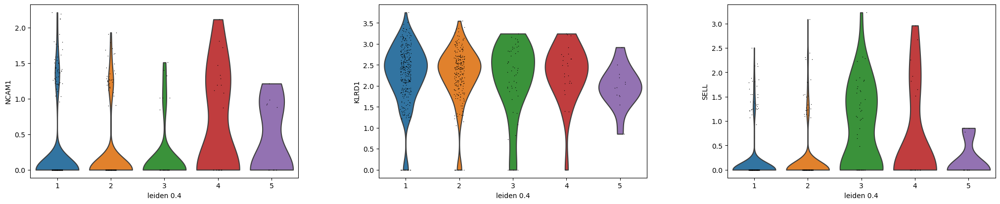

In [31]:
#Immature CD56bright proteins and corresponding RNA

sc.pl.violin(adata_latent, ['CD56', 'CD94', 'CD62L'], groupby='leiden_0.4')
sc.pl.violin(adata_latent, ['NCAM1', 'KLRD1', 'SELL'], groupby='leiden_0.4')
sc.set_figure_params(scanpy=True, fontsize=25, figsize = [7,5])



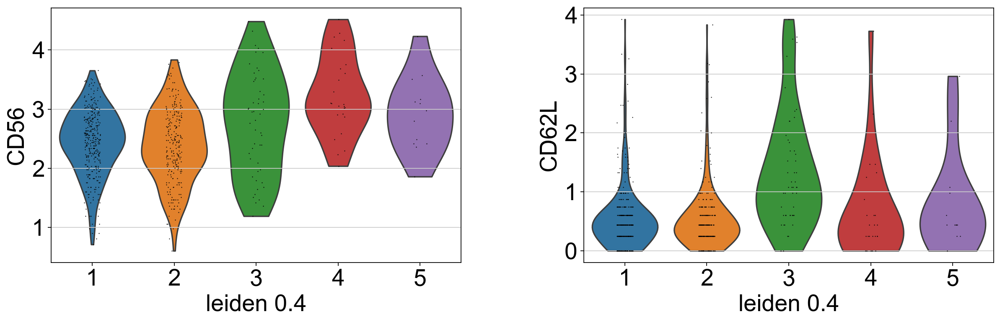

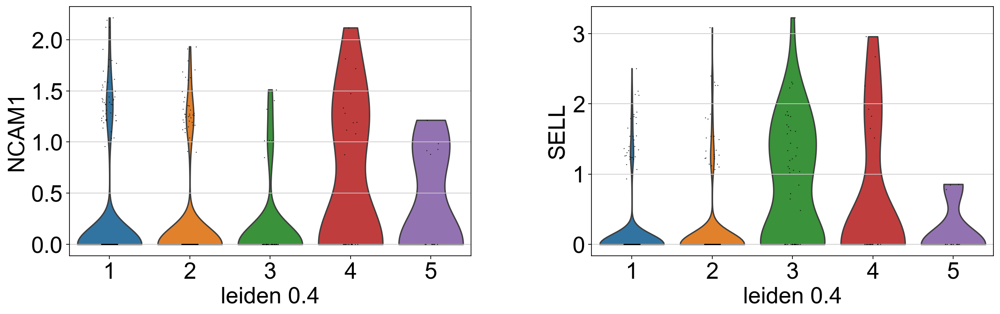

In [32]:
#Immature CD56bright proteins 

sc.pl.violin(adata_latent, ['CD56', 'CD62L'], groupby='leiden_0.4')
sc.pl.violin(adata_latent, ['NCAM1','SELL'], groupby='leiden_0.4')
sc.set_figure_params(scanpy=True, fontsize=25, figsize = [7,5])

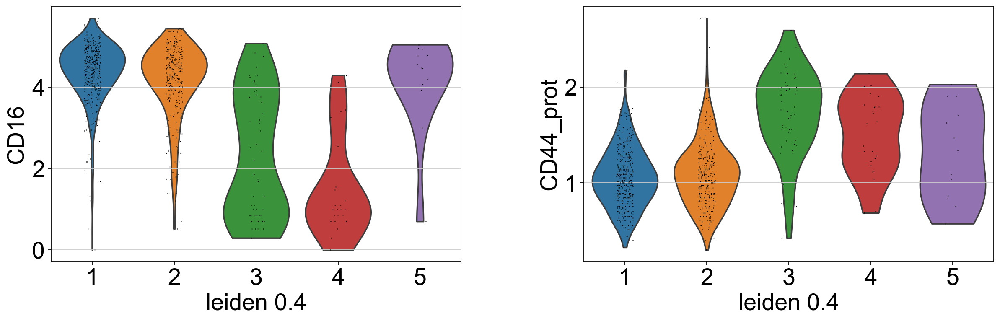

In [33]:
sc.pl.violin(adata_latent, ['CD16', 'CD44_prot'], groupby='leiden_0.4')

sc.set_figure_params(scanpy=True, fontsize=20, figsize = [7,5])


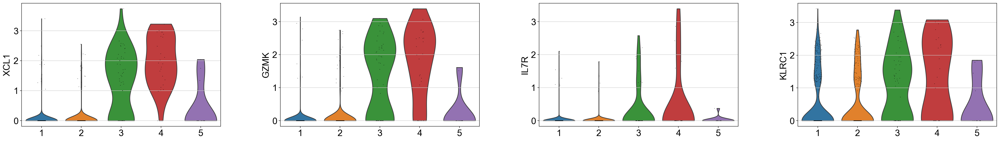

In [34]:
#Immature CD56bright RNA markers


sc.pl.violin(adata_latent, ['XCL1', 'GZMK', 'IL7R', 'KLRC1'], groupby='leiden_0.4', xlabel = ' ')

sc.set_figure_params(scanpy=True, fontsize=25, figsize = [7,5])




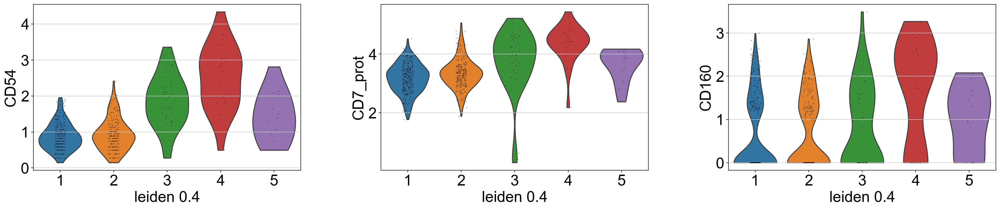

In [37]:
#tissue-resident NK, high markers, these markers identified by Catboost
sc.pl.violin(adata_latent, ['CD54', 'CD7_prot', 'CD160'], groupby='leiden_0.4')

- "Core Trm gene expression signatures including upregulation of the integrin ITGAE (CD103), ITGA1, and the chemokine receptor CXCR6 and downregulation of tissue egress molecules S1PR1 and KLF2"" 
- Reference: Dogra et al. (2020) Tissue Determinants of Human NK Cell Development, Function, and Residence

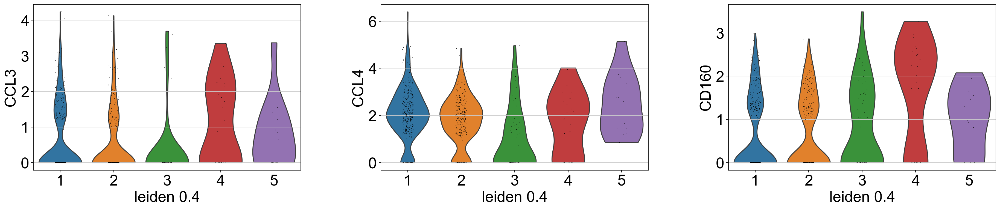

In [37]:
#Tissue-resident

sc.pl.violin(adata_latent, ['CCL3', 'CCL4', 'CD160'], groupby='leiden_0.4')

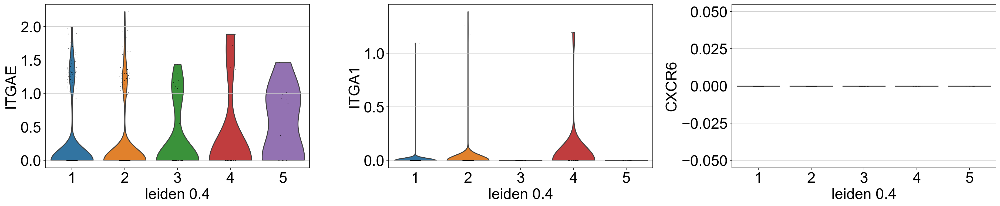

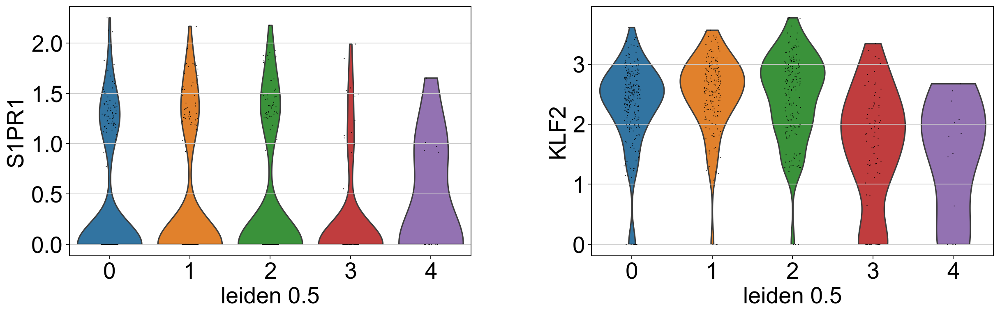

In [38]:
sc.pl.violin(adata_latent, ['ITGAE', 'ITGA1', 'CXCR6'], groupby='leiden_0.4')

sc.pl.violin(adata_latent, ['S1PR1', 'KLF2'], groupby='leiden_0.5')

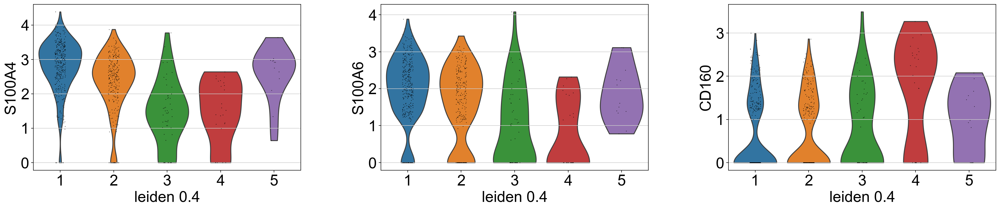

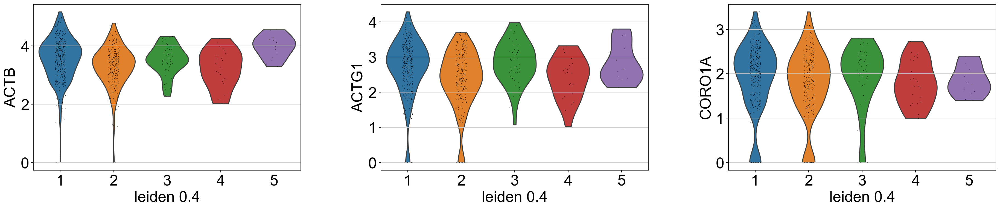

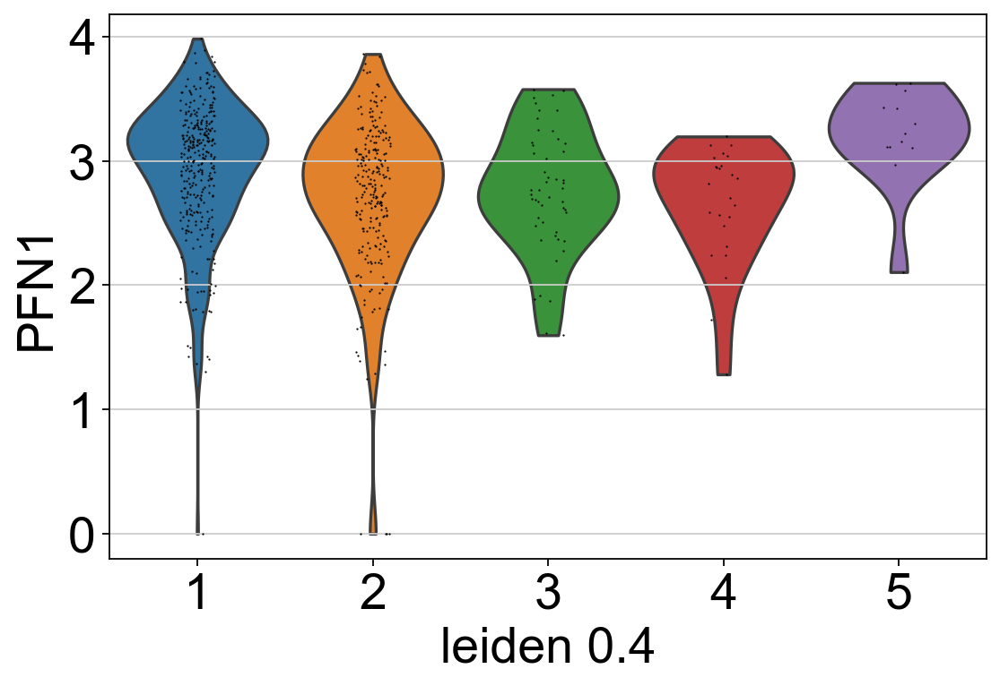

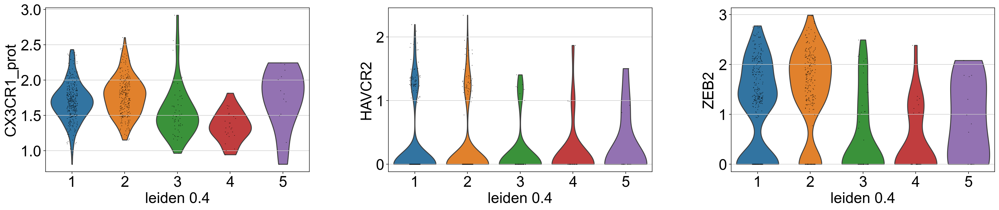

In [39]:
#Terminally differentiated 

#Terminally differentiated NK
sc.pl.violin(adata_latent, ['S100A4', 'S100A6', 'CD160'], groupby='leiden_0.4')

#Cytoskeleton markers  => CD57+ high cytotoxicity 
sc.pl.violin(adata_latent, ['ACTB', 'ACTG1', 'CORO1A'], groupby='leiden_0.4') 
sc.pl.violin(adata_latent, ['PFN1'], groupby='leiden_0.4')

# CX3CR1, HAVCR2 (TIM-3), and ZEB2 

sc.pl.violin(adata_latent, ['CX3CR1_prot', 'HAVCR2', 'ZEB2'], groupby='leiden_0.4')



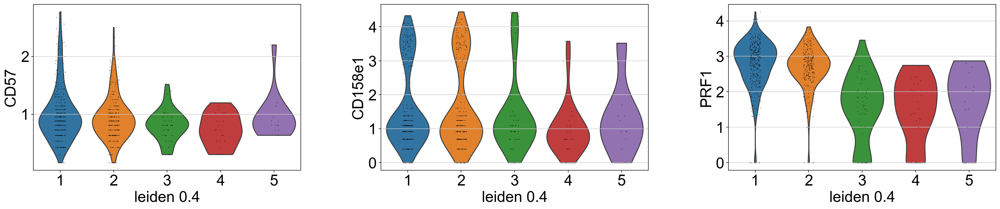

In [39]:
#Terminally differentiated NK

sc.pl.violin(adata_latent, ['CD57', 'CD158e1', 'PRF1'], groupby='leiden_0.4')

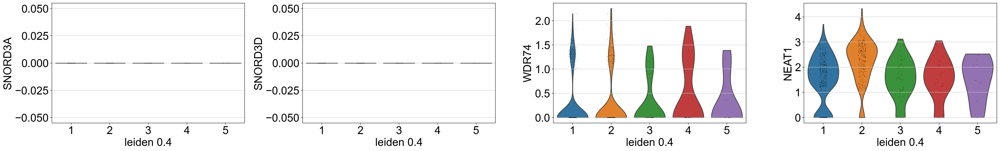

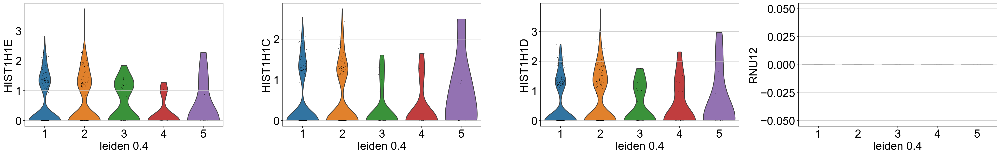

In [48]:
#to distinguish terminal NK from mature NK


sc.pl.violin(adata_latent, ['SNORD3A','SNORD3D', 'WDR74', 'NEAT1'] , groupby='leiden_0.4')
sc.pl.violin(adata_latent, [ 'HIST1H1E', 'HIST1H1C' , 'HIST1H1D' ,'RNU12'] , groupby='leiden_0.4')

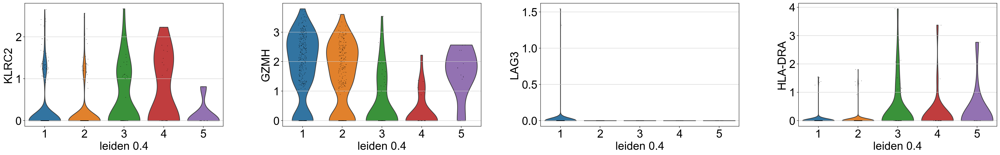

In [49]:
#Adaptive NK cells, KLRC2 = NKG2A, from Dufva,Huuhtanen et al. paper(s)


sc.pl.violin(adata_latent, ['KLRC2', 'GZMH', 'LAG3', 'HLA-DRA'] , groupby='leiden_0.4')



## Cell cycle scoring

- Genes identified by Nestorowa et al., Blood 2016
- link to download https://satijalab.org/seurat/archive/v3.1/cell_cycle_vignette.html

- To verify that cluster 5 represents proliferating NK cells, cell cycle scores were calculated for all cells. 

In [40]:
#list of genes

cell_cycle_genes = [x.strip() for x in open('/Users/tiinatuononen/Desktop/Thesis/Project/data/cell_cycle_vignette_files/regev_lab_cell_cycle_genes.txt')]

In [41]:
#defining two lists, s-phase genes and g2m genes

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_latent.var_names]

In [42]:
#calculating scores

sc.tl.score_genes_cell_cycle(adata_latent, s_genes=s_genes, g2m_genes=g2m_genes)

In [43]:
adata_latent

AnnData object with n_obs × n_vars = 665 × 21604
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'leiden_0.4', 'leiden_0.5', 'leiden_0_6', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'C

In [44]:
#Calculating neighbors for UMAP

sc.pp.neighbors(adata_latent, use_rep="X_totalVI")   

sc.tl.umap(adata_latent)


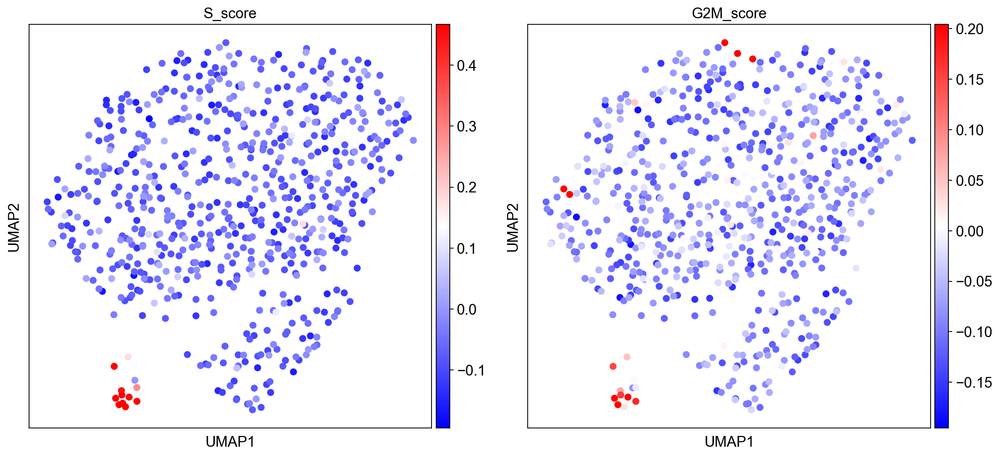

In [56]:
sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(adata_latent, color = ['S_score', 'G2M_score'], vmax="p99", color_map = 'bwr', ncols = 3)



- Confirm that cluster 5 is proliferating NK

## Searching transitional CD56dim GZMK+ cluster

- CD56 and CD16 expression low, while GZMK and TIGIT expression high.

Low expression (proteins)


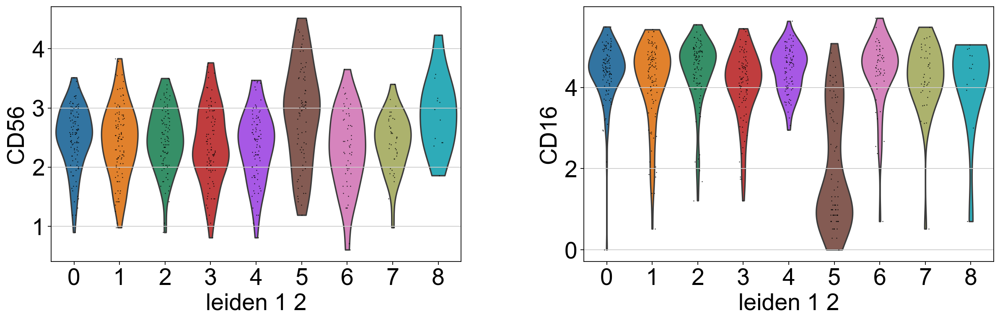

Higher expression (genes)


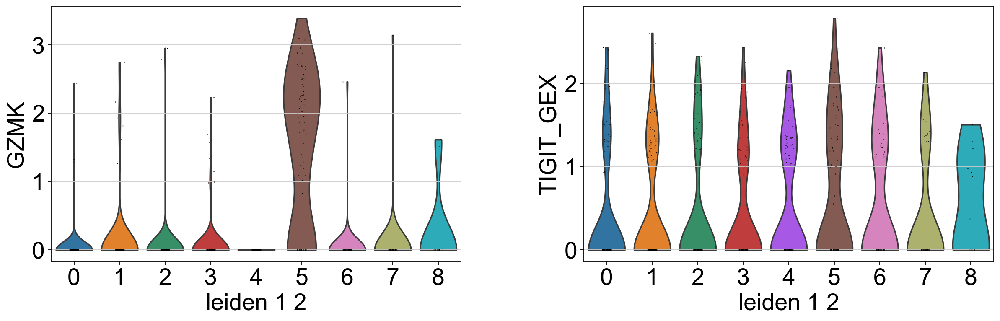

Higher expression (proteins)


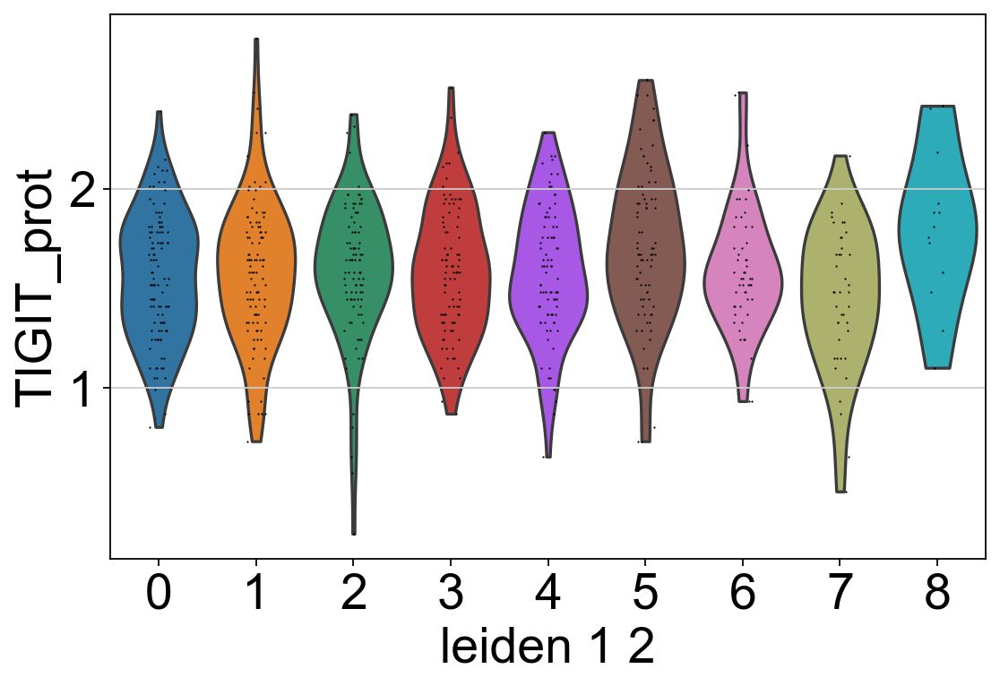

In [162]:
print("Low expression (proteins)")
sc.pl.violin(adata_latent, ['CD56', 'CD16'], groupby='leiden_1_2')

print("Higher expression (genes)")
sc.pl.violin(adata_latent, ['GZMK', 'TIGIT_GEX'], groupby='leiden_1_2')

print("Higher expression (proteins)")
sc.pl.violin(adata_latent, ['TIGIT_prot'], groupby='leiden_1_2')




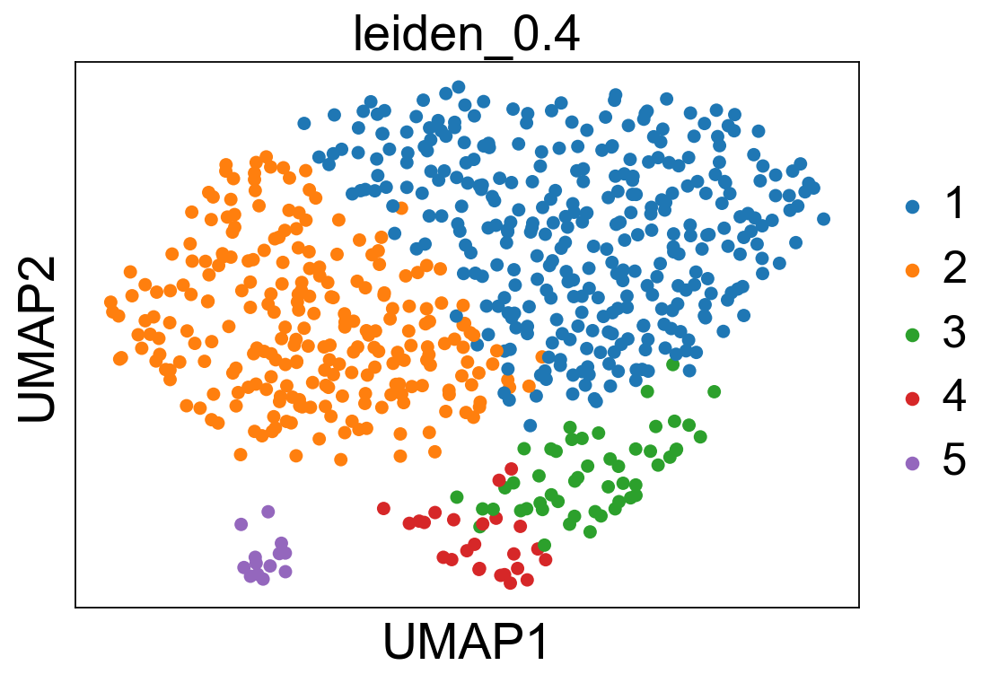

In [53]:
sc.pl.umap(adata_latent, color=['leiden_0.4'])

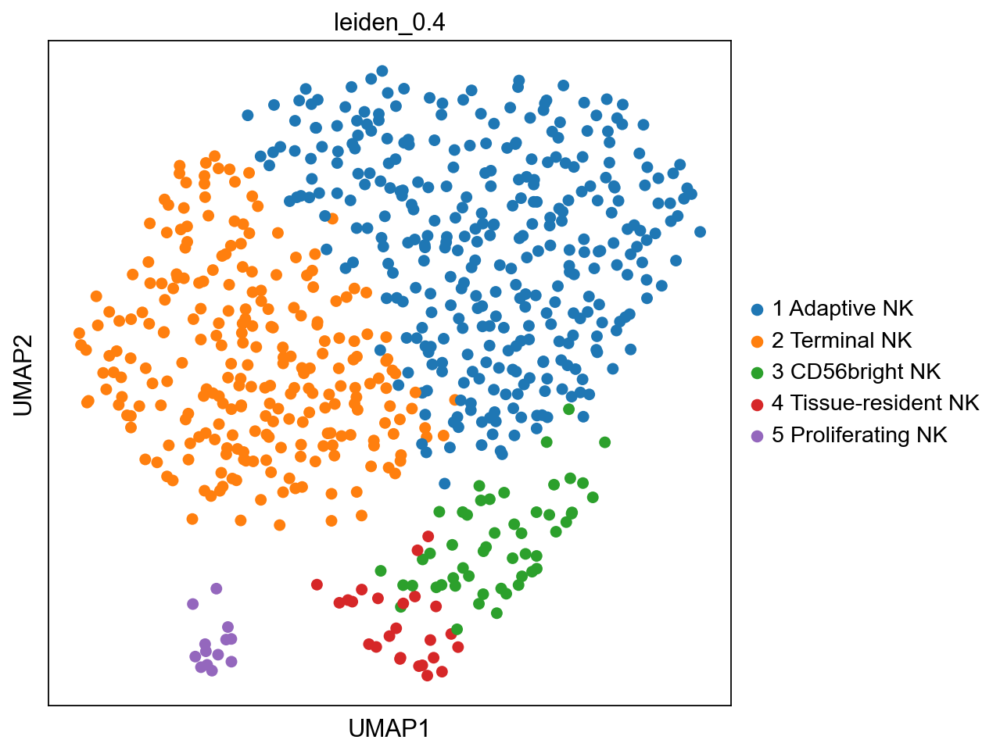

In [40]:
sc.set_figure_params(figsize=(7, 7))
new_cluster_names = [
    '1 Adaptive NK', '2 Terminal NK',
    '3 CD56bright NK', '4 Tissue-resident NK',
    '5 Proliferating NK']

adata_latent.rename_categories('leiden_0.4', new_cluster_names)

#Latent

sc.pl.umap(adata_latent, color=['leiden_0.4'])

## Visualizing proteins + corresponding genes

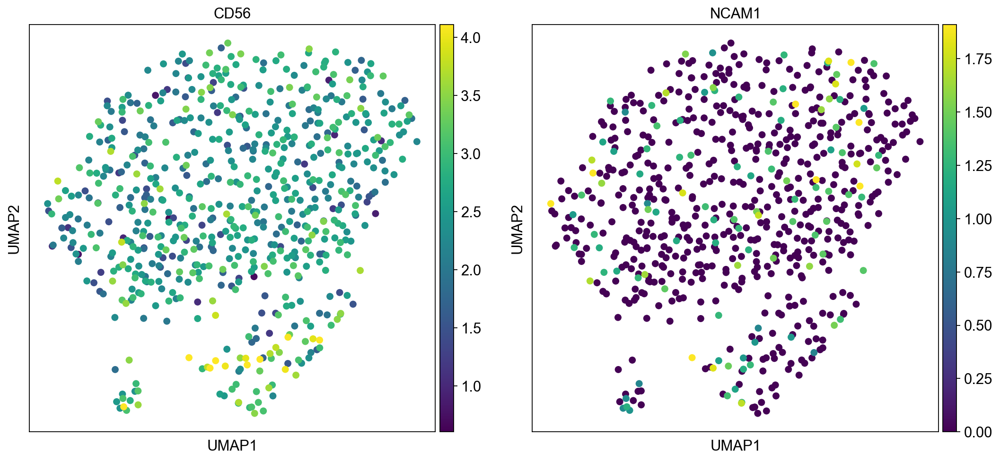

In [46]:
sc.pl.umap(adata_latent, color = ['CD56', 'NCAM1'], vmax="p99", color_map = 'viridis', ncols = 3)


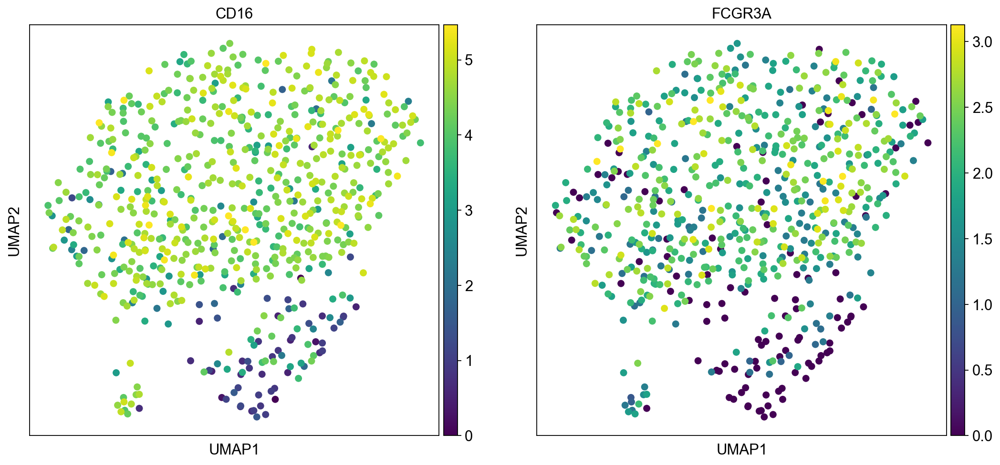

In [47]:
sc.pl.umap(adata_latent, color = ['CD16', 'FCGR3A'], vmax="p99", color_map = 'viridis', ncols = 3)


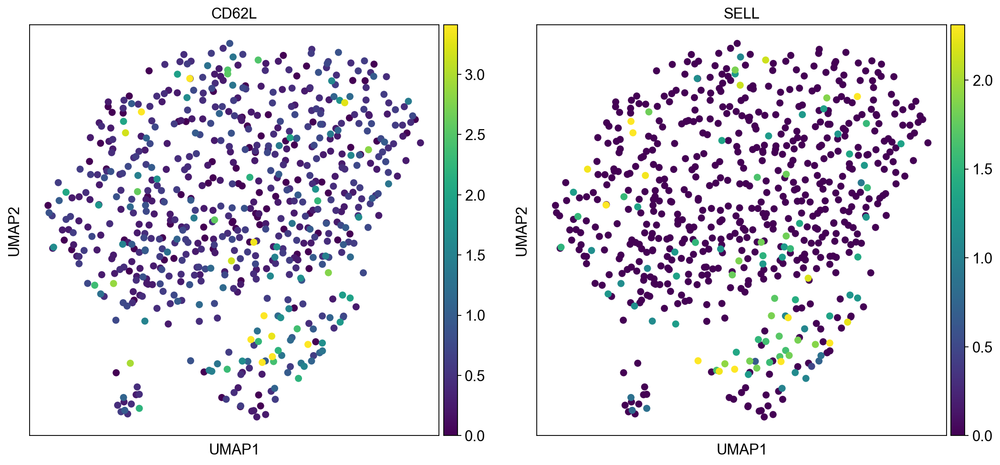

In [48]:
sc.pl.umap(adata_latent, color = ['CD62L', 'SELL'], vmax="p99", color_map = 'viridis', ncols = 3)


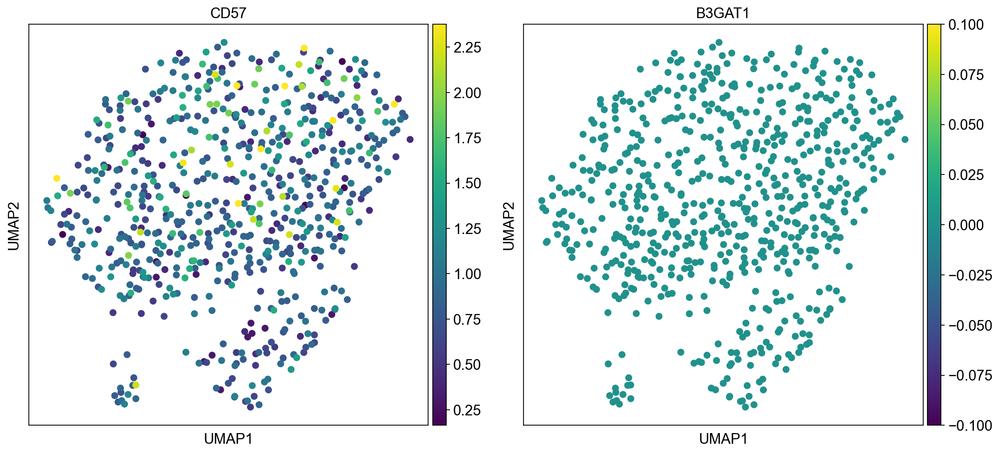

In [55]:
sc.pl.umap(adata_latent, color = ['CD57', 'B3GAT1'], vmax="p99", color_map = 'viridis', ncols = 3)


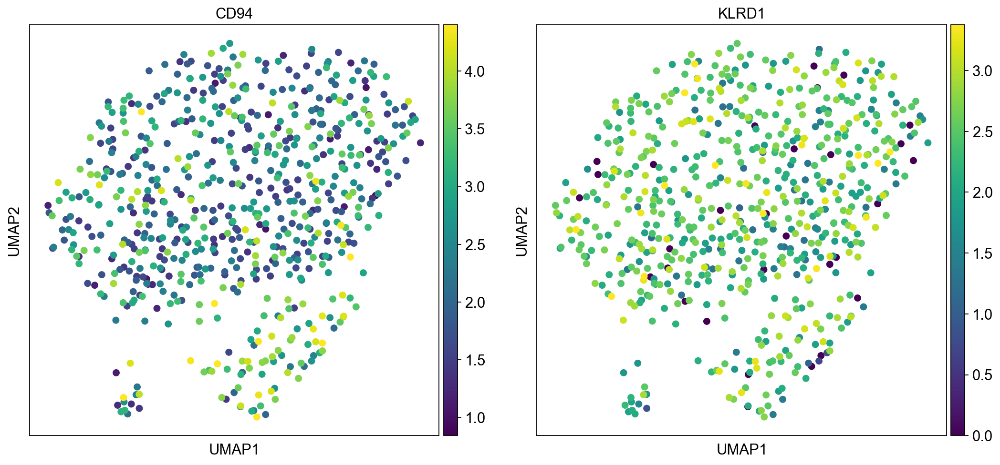

In [51]:
sc.pl.umap(adata_latent, color = ['CD94', 'KLRD1'], vmax="p99", color_map = 'viridis', ncols = 3)


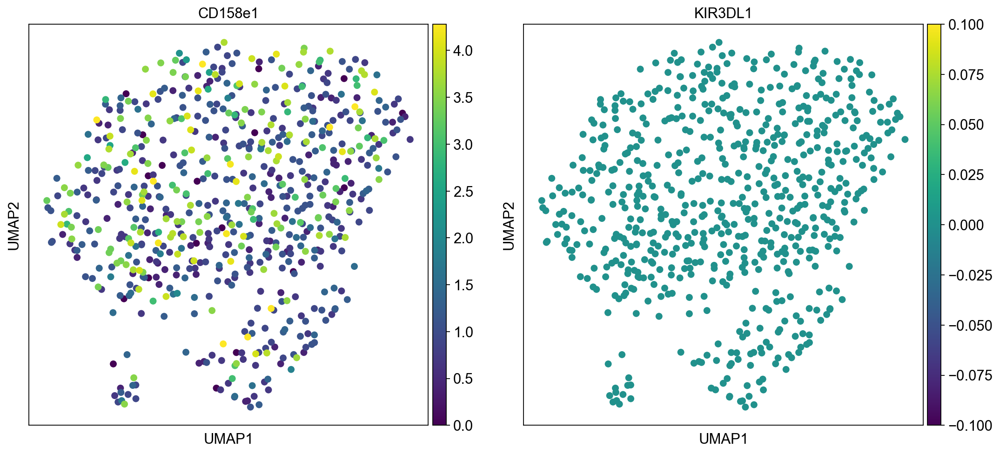

In [52]:
sc.pl.umap(adata_latent, color = ['CD158e1', 'KIR3DL1'], vmax="p99", color_map = 'viridis', ncols = 3)


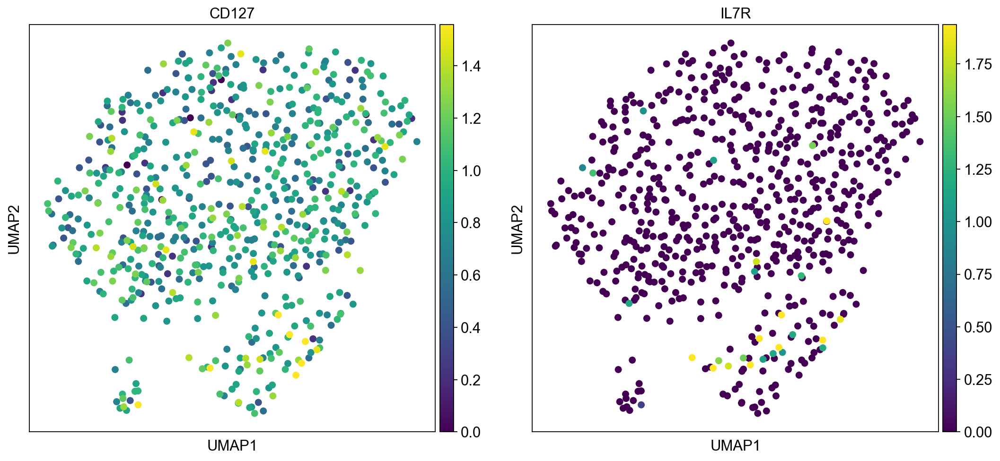

In [53]:
sc.pl.umap(adata_latent, color = ['CD127', 'IL7R'], vmax="p99", color_map = 'viridis', ncols = 3)
